In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import Adam
import torchvision.transforms as T
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm
from bendable_gan import BendedGenerator
from bending_modules import BendingConvModule, BendingConvModule_XY, \
    BendingCPPN, BendingDiffSort, BendingDiffSort_XY, ConcatenatedModules
from losses import compute_diversity_loss
from utils import generate_image, generate_image_from_seed, image_grid
from clip import TextPrompt, NCELoss
import gc

%load_ext autoreload
%autoreload 2

device = 'cuda'

/nfs/scistore14/alistgrp/eiofinov/anaconda3/envs/art2/lib/python3.10/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: libtorch_cuda_cu.so: cannot open shared object file: No such file or directory
  warn(f"Failed to load image Python extension: {e}")
/nfs/scistore14/alistgrp/eiofinov/anaconda3/envs/art2/lib/python3.10/site-packages/kornia/augmentation/augmentation.py:1830: DeprecationWarning: GaussianBlur is no longer maintained and will be removed from the future versions. Please use RandomGaussianBlur instead.
  warnings.warn(
/nfs/scistore14/alistgrp/eiofinov/anaconda3/envs/art2/lib/python3.10/site-packages/timm/models/layers/__init__.py:49: DeprecationWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", DeprecationWarning)


# Vanilla GAN

In [2]:
seeds = [i for i in range(16)]

In [3]:
vanillagen = BendedGenerator.from_pretrained("ceyda/butterfly_cropped_uniq1K_512")

In [4]:
exampleimgs = [generate_image_from_seed(vanillagen, seed=seeds[i]) for i in range(16)]
for i, img in enumerate(exampleimgs):
    img.save(f"butterfly_vanilla_{seeds[i]}.pdf")

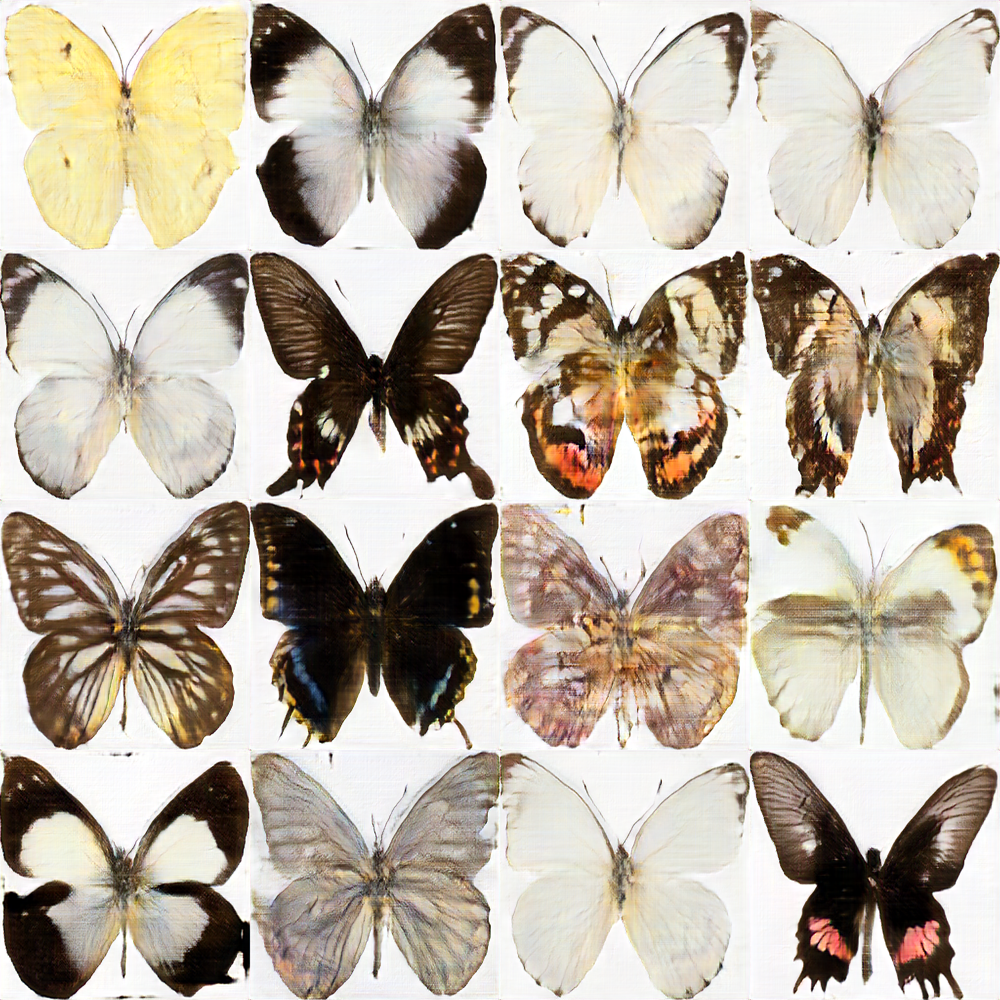

In [6]:
image_grid(exampleimgs, 4, 4)

# Video making preliminaries

In [21]:
# This part fixes the randomness that is used to generate the movie frames.
# I picked the #13 butterfly (last row 2nd from right), but you can pick
# another one!
torch.manual_seed(13)
randomness = torch.randn(1, 256)  # This will be used throughout.
randomness = randomness.to(device)

# Important! generate_image_from_seed from the utils won't do what you want.
# This will.
def generate_image_from_rand(model, randomness):
  with torch.no_grad():
        ims = model(randomness,
                    return_inout=True)
        ims = ims[0].detach().cpu().permute(0,2,3,1).clamp_(0., 1.)  * 255.
        ims = ims.numpy().astype(np.uint8)
  return Image.fromarray(ims[0])

In [4]:
# The video making is kind of unstable when paired with Jupyter,
# so I suggest saving generated frames as you go.
import pickle as pkl

def save_to_pickle(frames, filename):
    with open(f'{filename}.pkl', 'wb') as f: 
        pkl.dump(frames, f)

def load_from_pickle(filename):
    with open(f'{filename}.pkl', 'rb') as f: 
        frames = pkl.load(f)
    return frames

In [32]:
# Finally, some movie making utils.

import matplotlib.animation as animation
%matplotlib notebook

def make_movie(frames, filename="testmovie"):
    fig, ax = plt.subplots()

    ims = []
    for i, frame in enumerate(frames):
        im = ax.imshow(frame, animated=True)
        ims.append([im])
        if i == 0:
            ax.imshow(frame)  # show an initial one first
    ani = animation.ArtistAnimation(fig, ims, interval=1, blit=True, repeat_delay=0)

    ani.save(f"{filename}.mp4")

# This is how you can view the movie inside the jupyter.
# But save your frames
#from IPython.display import Video
#Video("myothernewmovie1.mp4", embed=True)

## CLIP Loss (+ diversity losses)

In [19]:
# Create new bending module to optimize
# with CLIP loss

numchans = [1024, 1024, 512, 256, 128, 64, 6]

bending_idx = 5



bendingmod_clip = BendingConvModule(numchans[bending_idx],
                                    act_fn='sin')

bend_generator_clip = BendedGenerator.from_pretrained("ceyda/butterfly_cropped_uniq1K_512",
                                                 bending_module=bendingmod_clip,
                                                 bending_idx=bending_idx,
                                                 train_bending=True)
bend_generator_clip = bend_generator_clip.to(device)


tgt_text = 'Low-poly rendering of Benjamin Franklin going to Venice'
tgt_text = 'Dinosaur tiffany lamp'
tgt_text = 'Psychedelic painting of a multi-armed deity'
tgt_text = 'Inflatable plastic bodybuilder in a colorful album cover painted by Magritte'
text_prompt = TextPrompt(tgt_text, device=device)
nce_loss = NCELoss(tgt_text, device=device, temperature=0.001)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [05:50<00:00,  2.85it/s]


<IPython.core.display.Javascript object>


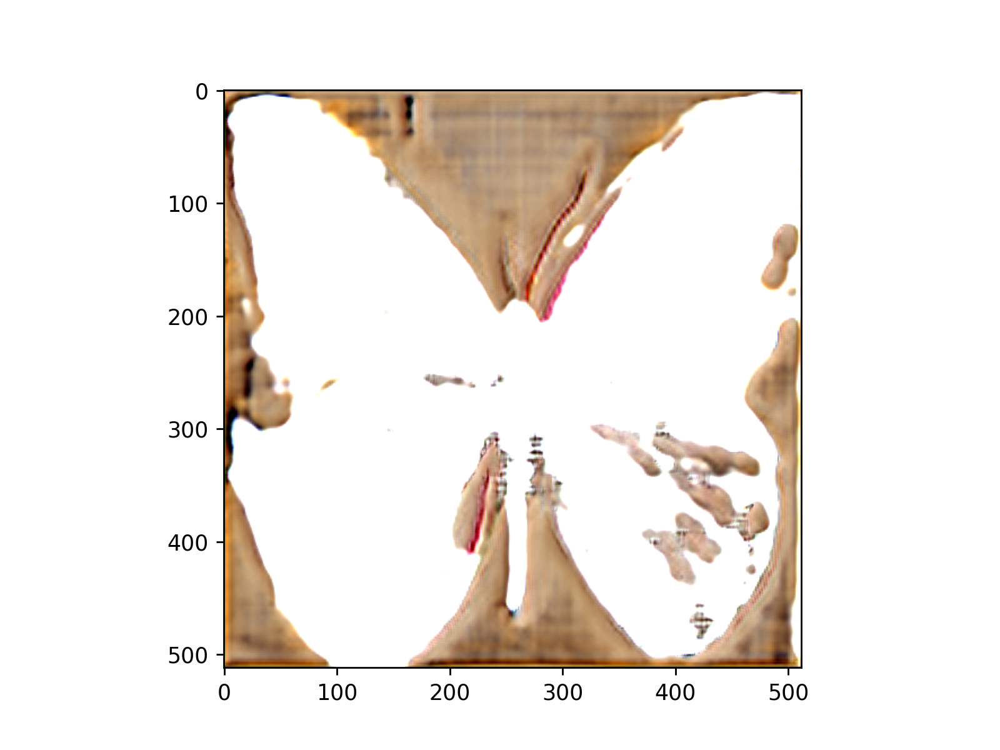

TypeError: 'AxesImage' object is not iterable

In [22]:
torch.cuda.empty_cache()

import random
random.seed(23456)
np.random.seed(54321)
torch.manual_seed(12345)

batch_size = 32

n_iter = 1000

div_loss = False
div_weight = 6.
div_loss_clip = True
div_clip_weight = 6.

opt = Adam(bendingmod_clip.parameters(), 1e-3)

loss_log = []
results = [] #Frames will go here.


for i in tqdm(range(n_iter)):
    # For CLIP loss, the videos seem to look the most reasonable
    # if we take all 100 initial frames, then sample every 10. 
    # But of course this is tunable.
    if i <100 or i % 10 == 0:
        img = generate_image_from_rand(bend_generator_clip, randomness)
        bend_generator_clip.to(device)
        results.append(img)
    
    noise_input = torch.randn(batch_size, 
                    bend_generator_clip.latent_dim, 
                    device=device)
    
    out, b_in, _ = bend_generator_clip(noise_input, return_inout=True)
    out = out.clamp_(0., 1.)
        
    if div_loss_clip:
        loss, clip_div = text_prompt(out, diversity=True)
        loss += div_clip_weight * clip_div
    else:
        loss = nce_loss(out) #text_prompt(out)
    if div_loss:
        loss += div_weight * compute_diversity_loss(out, b_in)
    
    loss_log.append(loss.detach().cpu().numpy())

    with torch.no_grad():
        loss.backward()
        opt.step()
        opt.zero_grad()
    
    
plt.plot(range(n_iter), loss_log) 

save_to_pickle(results, "magritte_CLIP")
make_movie(results, "magritte_CLIP")

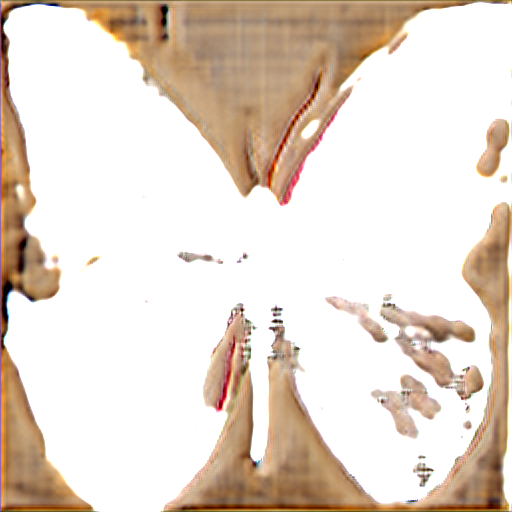

In [27]:
results[-1]

In [33]:
del bendingmod_clip, bend_generator_clip, text_prompt, nce_loss, noise_input#, b_in, b_out

gc.collect()
torch.cuda.empty_cache()

## Convolutional with coordinates - I didn't try this part again

In [10]:
# Create new bending module to optimize
# with CLIP loss

device = 'cuda'
numchans = [1024, 1024, 512, 256, 128, 64, 6]
inputsizes = [8, 16, 32, 64, 128, 256, 512]

bending_idx = 5

bendingmod_clip = BendingConvModule_XY(numchans[bending_idx],
                                       inputsizes[bending_idx],
                                       act_fn='sin')

bend_generator_clip = BendedGenerator.from_pretrained("ceyda/butterfly_cropped_uniq1K_512",
                                                 bending_module=bendingmod_clip,
                                                 bending_idx=bending_idx,
                                                 train_bending=True)
bend_generator_clip = bend_generator_clip.to(device)

tgt_text = 'A gang of biker pumpkins painted by Jan van Eyck'
tgt_text = 'A tree painted by Cezanne'
#text_prompt = TextPrompt(tgt_text, device=device)
nce_loss = NCELoss(tgt_text, temperature=0.01, device=device)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [05:35<00:00,  5.96it/s]


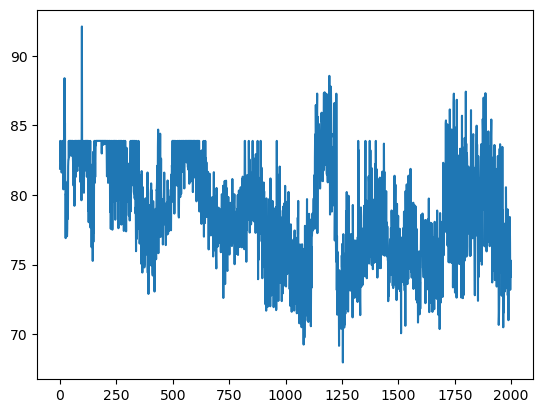

In [11]:
torch.cuda.empty_cache()

#torch.manual_seed(12345)

batch_size = 16

n_iter = 1000

opt = Adam(bendingmod_clip.parameters(), 1e-3)

loss_log = []

for i in tqdm(range(n_iter)):
    
    noise_input = torch.randn(batch_size, 
                    bend_generator_clip.latent_dim, 
                    device=device)
    
    out = bend_generator_clip(noise_input)
    out = out.clamp_(0., 1.)
        

    loss = nce_loss(out)
    loss_log.append(loss.detach().cpu().numpy())

    with torch.no_grad():
        loss.backward()
        opt.step()
        opt.zero_grad()
    
    
plt.plot(range(n_iter), loss_log)   

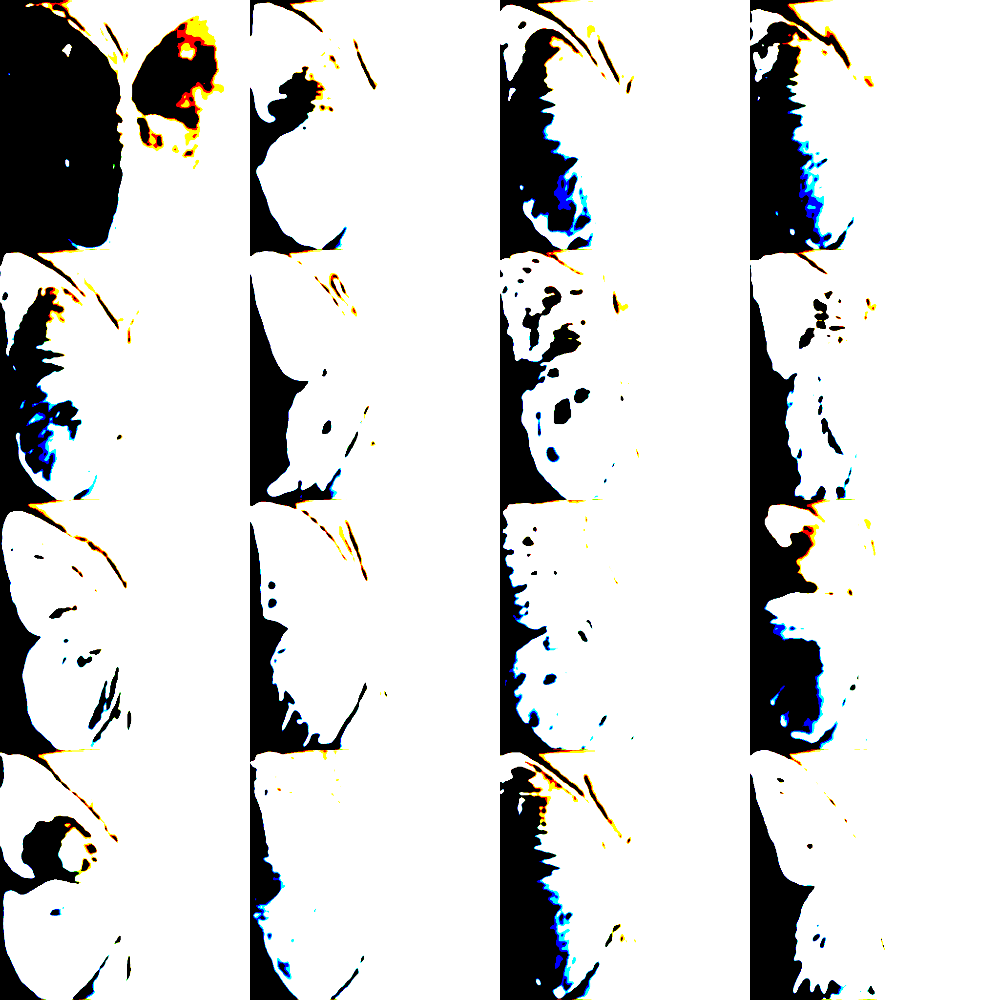

In [12]:
exampleimgs = [generate_image_from_seed(bend_generator_clip, seed=seeds[i]) for i in range(16)]
image_grid(exampleimgs, 4, 4)

In [ ]:
del bendingmod_clip, bend_generator_clip, nce_loss, noise_input#, b_in, b_out
import gc
gc.collect()
torch.cuda.empty_cache()

## Differentiable sorting

In [34]:
# Create new bending module to optimize
# with CLIP loss

numchans = [1024, 1024, 512, 256, 128, 64, 6]
inputsizes = [8, 16, 32, 64, 128, 256, 512]

bending_idx = 3

# import copy

# torch.manual_seed(13)
# randomness = torch.randn(1, 256)
# randomness = randomness.to(device)
# def generate_image_from_rand(model, randomness):
#   with torch.no_grad():
#         ims = model(randomness,
#                     return_inout=True)
#         ims = ims[0].detach().cpu().permute(0,2,3,1).clamp_(0., 1.)  * 255.
#         ims = ims.numpy().astype(np.uint8)
#   return Image.fromarray(ims[0])


bendingmod_clip = BendingConvModule(numchans[bending_idx],
                                    act_fn='relu')
bendsorting_clip = BendingDiffSort_XY(numchans[bending_idx],
                                   inputsizes[bending_idx],
                                   perm_rows=True, perm_cols=False)
combined_bendmodule = ConcatenatedModules([bendsorting_clip, bendingmod_clip])

In [35]:
bend_generator_sort = BendedGenerator.from_pretrained("ceyda/butterfly_cropped_uniq1K_512",
                                                 bending_module=combined_bendmodule,
                                                 bending_idx=bending_idx,
                                                 train_bending=True)
bend_generator_sort = bend_generator_sort.to(device)

tgt_text = 'A colorful tree painted by Cezanne'
#tgt_text = 'Low-poly rendering of Benjamin Franklin going to Venice'
#tgt_text = 'Low-poly rendering of Benjamin Franklin going to Venice'
text_prompt = TextPrompt(tgt_text, device=device)
nce_loss = NCELoss(tgt_text, device=device, temperature=0.01)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [03:14<00:00,  5.14it/s]


<IPython.core.display.Javascript object>


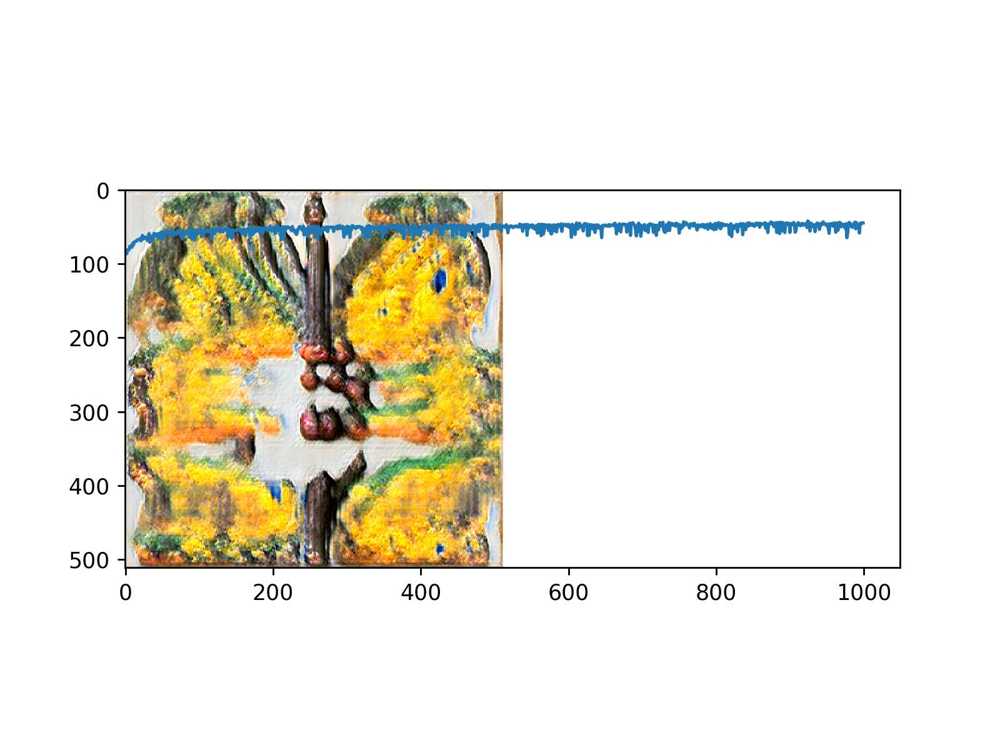

In [36]:
torch.cuda.empty_cache()

import random
random.seed(23456)
np.random.seed(54321)
torch.manual_seed(12345)
#torch.use_deterministic_algorithms(True, warn_only=True)

batch_size = 16

n_iter = 1000

div_loss = False
div_weight = 6.
div_loss_clip = False
div_clip_weight = 6.

opt = Adam(combined_bendmodule.parameters(), 1e-4)

loss_log = []
diffsort_results = []

for i in tqdm(range(n_iter)):
    
    if True:
        img = generate_image_from_rand(bend_generator_sort, randomness)
        #bend_generator_sort.to(device)
        diffsort_results.append(img)
    
    noise_input = torch.randn(batch_size, 
                    bend_generator_sort.latent_dim, 
                    device=device)
    
    out, b_in, _ = bend_generator_sort(noise_input, return_inout=True)
    out = out.clamp_(0., 1.)
        
    if div_loss_clip:
        loss, clip_div = text_prompt(out, diversity=True)
        loss += div_clip_weight * clip_div
    else:
        loss = nce_loss(out) #text_prompt(out)
    if div_loss:
        loss += div_weight * compute_diversity_loss(out, b_in)
    
    loss_log.append(loss.detach().cpu().numpy())

    with torch.no_grad():
        loss.backward()
        opt.step()
        opt.zero_grad()
    
save_to_pickle(diffsort_results, "cezane_diffsort")
#make_movie(diffsort_results, "magritte_diffsort")
plt.plot(range(n_iter), loss_log)   

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [03:17<00:00,  5.05it/s]


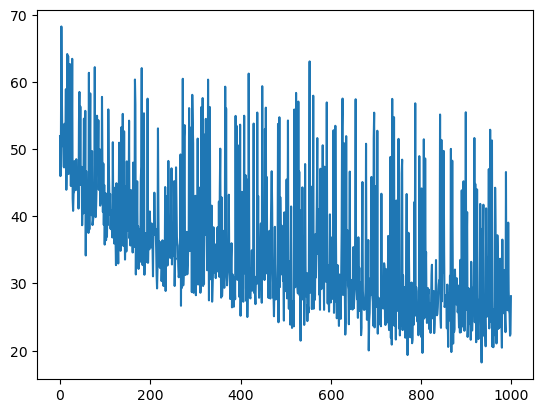

In [8]:
tgt_text = 'Hieronymus Bosch particle system rendered in Blender'
#tgt_text = 'Low-poly rendering of Benjamin Franklin going to Venice'
#tgt_text = 'Low-poly rendering of Benjamin Franklin going to Venice'
text_prompt = TextPrompt(tgt_text, device=device)
nce_loss = NCELoss(tgt_text, device=device, temperature=0.01)

diffsort_bosch_results = []
loss_log = []

for i in tqdm(range(n_iter)):
    
    if True:
        img = generate_image_from_rand(bend_generator_sort, randomness)
        #bend_generator_sort.to(device)
        diffsort_bosch_results.append(img)
    
    noise_input = torch.randn(batch_size, 
                    bend_generator_sort.latent_dim, 
                    device=device)
    
    out, b_in, _ = bend_generator_sort(noise_input, return_inout=True)
    out = out.clamp_(0., 1.)
        
    if div_loss_clip:
        loss, clip_div = text_prompt(out, diversity=True)
        loss += div_clip_weight * clip_div
    else:
        loss = nce_loss(out) #text_prompt(out)
    if div_loss:
        loss += div_weight * compute_diversity_loss(out, b_in)
    
    loss_log.append(loss.detach().cpu().numpy())

    with torch.no_grad():
        loss.backward()
        opt.step()
        opt.zero_grad()
    
save_to_pickle(diffsort_bosch_results, "bosch_diffsort")    
plt.plot(range(n_iter), loss_log)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [03:13<00:00,  5.16it/s]


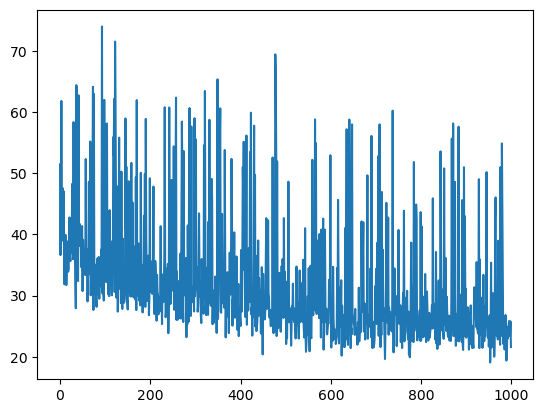

In [13]:
tgt_text = 'A gang of biker pumpkins painted by Jan van Eyck'
#tgt_text = 'Low-poly rendering of Benjamin Franklin going to Venice'
#tgt_text = 'Low-poly rendering of Benjamin Franklin going to Venice'
text_prompt = TextPrompt(tgt_text, device=device)
nce_loss = NCELoss(tgt_text, device=device, temperature=0.01)

diffsort_pumpkins_results = []
loss_log = []

for i in tqdm(range(n_iter)):
    
    if True:
        img = generate_image_from_rand(bend_generator_sort, randomness)
        #bend_generator_sort.to(device)
        diffsort_pumpkins_results.append(img)
    
    noise_input = torch.randn(batch_size, 
                    bend_generator_sort.latent_dim, 
                    device=device)
    
    out, b_in, _ = bend_generator_sort(noise_input, return_inout=True)
    out = out.clamp_(0., 1.)
        
    if div_loss_clip:
        loss, clip_div = text_prompt(out, diversity=True)
        loss += div_clip_weight * clip_div
    else:
        loss = nce_loss(out) #text_prompt(out)
    if div_loss:
        loss += div_weight * compute_diversity_loss(out, b_in)
    
    loss_log.append(loss.detach().cpu().numpy())

    with torch.no_grad():
        loss.backward()
        opt.step()
        opt.zero_grad()
    
save_to_pickle(diffsort_pumpkins_results, "pumpkins_diffsort")        
plt.plot(range(n_iter), loss_log)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [03:14<00:00,  5.14it/s]


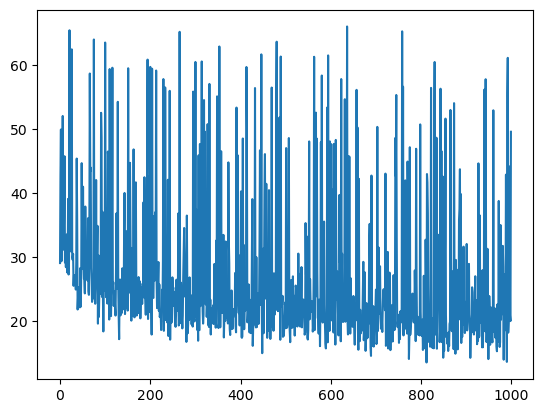

In [18]:
tgt_text = 'Inflatable plastic bodybuilder in a colorful album cover painted byMagritte'
#tgt_text = 'Low-poly rendering of Benjamin Franklin going to Venice'
#tgt_text = 'Low-poly rendering of Benjamin Franklin going to Venice'
text_prompt = TextPrompt(tgt_text, device=device)
nce_loss = NCELoss(tgt_text, device=device, temperature=0.01)

diffsort_magritte_results = []
loss_log = []

for i in tqdm(range(n_iter)):
    
    if True:
        img = generate_image_from_rand(bend_generator_sort, randomness)
        #bend_generator_sort.to(device)
        diffsort_magritte_results.append(img)
    
    noise_input = torch.randn(batch_size, 
                    bend_generator_sort.latent_dim, 
                    device=device)
    
    out, b_in, _ = bend_generator_sort(noise_input, return_inout=True)
    out = out.clamp_(0., 1.)
        
    if div_loss_clip:
        loss, clip_div = text_prompt(out, diversity=True)
        loss += div_clip_weight * clip_div
    else:
        loss = nce_loss(out) #text_prompt(out)
    if div_loss:
        loss += div_weight * compute_diversity_loss(out, b_in)
    
    loss_log.append(loss.detach().cpu().numpy())

    with torch.no_grad():
        loss.backward()
        opt.step()
        opt.zero_grad()
    
save_to_pickle(diffsort_magritte_results, "magritte_diffsort")    
plt.plot(range(n_iter), loss_log)

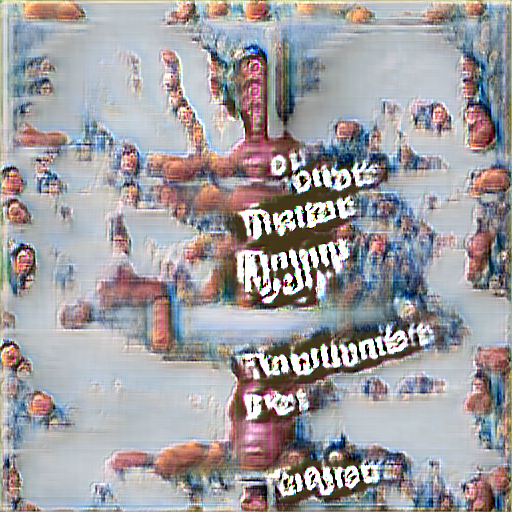

In [22]:
diffsort_magritte_results[500]

In [ ]:
make_movie(diffsort_results + diffsort_bosch_results +
           diffsort_pumpkin_results + diffsort_magritte_results, "compound")